**Author:** Regina Hoo

**Institution:** Wellcome Sanger institute

**April, 2023**

---

## Notebook to do fine annotation per cell compartment  - Donor Hrv132


In [1]:
import numpy as np
x = np.array([1, 2, 3], dtype=np.int_)
import pandas as pd
import scanpy as sc
import os
import sys
import anndata

import seaborn as sns 

import matplotlib.pyplot as plt
import matplotlib as mpl
import gc


In [2]:
def MovePlots(plotpattern, subplotdir):
    os.system('mkdir -p '+str(sc.settings.figdir)+'/'+subplotdir)
    os.system('mv '+str(sc.settings.figdir)+'/*'+plotpattern+'** '+str(sc.settings.figdir)+'/'+subplotdir)

sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.figdir = './figures/annotation'
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=300)  # low dpi (dots per inch) yields small inline figures

sys.executable

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyterlab_server   2.3.0
kiwisolver          1.3.1


'/opt/conda/bin/python'

In [3]:
def identityTransfer(adata_CellsNewID, adata, field='identity'):
    
    '''
    Function to transfer the value in a .obs column, modifying only the cells included in adata_CellsNewID
    
    Parameters:
        adata_CellsNewID: anndata object with cells. These should have in their .obs[field] the new values to be transfer to adata
        adata: anndata object to modify. The value in .obs[field] will be modifies for all the cells in adata_CellsNewID
        field: column name in .obs to operate in
        
    '''
    
    #converting categorical into strings to introduce new categories
    adata.obs[field]=adata.obs[field].astype("string")


    #assigning the new categories to the cells in adata
    for cell in adata_CellsNewID.obs.index:
        adata.obs[field][cell] = adata_CellsNewID.obs[field][cell]

    #Returning strings into categorical 
    adata.obs[field]=adata.obs[field].astype("category")
    
    return(adata)

In [4]:
def runTF_IDF(adata, groupby, method='wilcoxon'):
    
    '''
    Function to run TF-IDF and DE analysis. TF-IDF means term-frequency times inverse document-frequency. 
    Its goal is to scale down the impact of tokens that occur very frequently (i.e. less informative)
    than features that occur in a small fraction of the training corpus.
    The the function applies a DE analysis.
    
    Parameters:
        adata: anndata object with cells.
        groupby: column name in .obs to make the DE comparison.
        method: method to use for Differential expression.
    
    Return:
        anndata object with the DE genes stored in adata.uns['rank_genes_groups']
        
    '''
    
    
    counts = anndata.AnnData(X=adata.raw.X, var=adata.raw.var, obs=adata.obs, asview=False)


    #-- Binarize counts matrix (1 if expressed, 0 otherwise)
    adata_bin = epi.pp.binarize(counts, copy=True)
    adata_bin.X.shape


    #-- Compute TF-IDF
    transformer = TfidfTransformer()
    tfidf = transformer.fit_transform(adata_bin.X.T)
    adata_bin.X = tfidf.T
    adata_bin.X.shape


    #-- Compute Mann-Withney test with scanpy
    sc.tl.rank_genes_groups(adata_bin, groupby= groupby, use_raw=False, method=method)

    return(adata_bin)

In [5]:
sc.set_figure_params(figsize=(6,6))

In [6]:
adata= sc.read('rna4_annotate_donorHrv132_all_noDoublets.h5ad')

In [7]:
adata

AnnData object with n_obs × n_vars = 6362 × 36601
    obs: 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'n_genes', 'batch', 'HTO3', 'HTO4', 'HTO5', 'total_hto_counts', 'fraction_HTO3', 'fraction_HTO4', 'fraction_HTO5', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'leiden', 'celltype_predictions', 'probabilities', 'identity'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Classification_colors', 'celltype_predictions_colors', 'donor_colors', 'hvg', 'identity_colors', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap'
    obsm: 'X_pca', 'X_umap'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'

In [8]:
#Normalizing the data
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

normalizing by total count per cell
/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


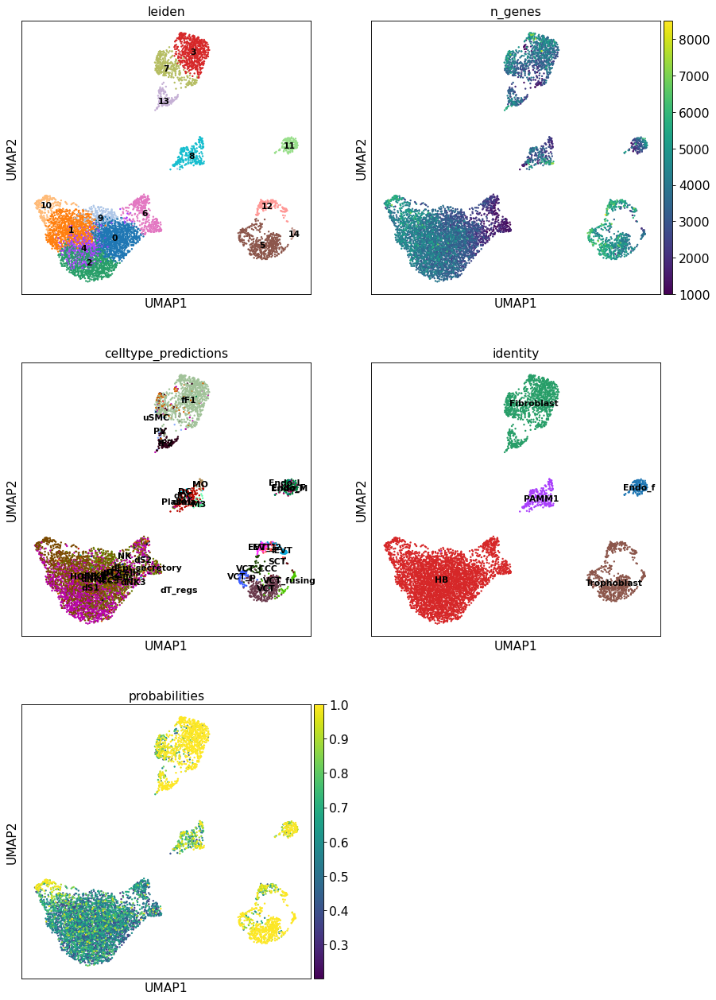

In [9]:
sc.pl.umap(adata, color=["leiden", 'n_genes', 'celltype_predictions', 'identity', 'probabilities'],legend_loc='on data',
           legend_fontsize='x-small',
           ncols=2, wspace=0.1)

# Fine annotation

### -- Endo --

In [10]:
temp_cells = adata[adata.obs['identity'] == 'Endo_f']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [11]:
# Run PCA
#sc.tl.pca(temp_cells)

sc.pp.neighbors(temp_cells, n_neighbors=20)
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden", resolution=0.5)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:11)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:00)
running Leiden clustering
    finished: found 4 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


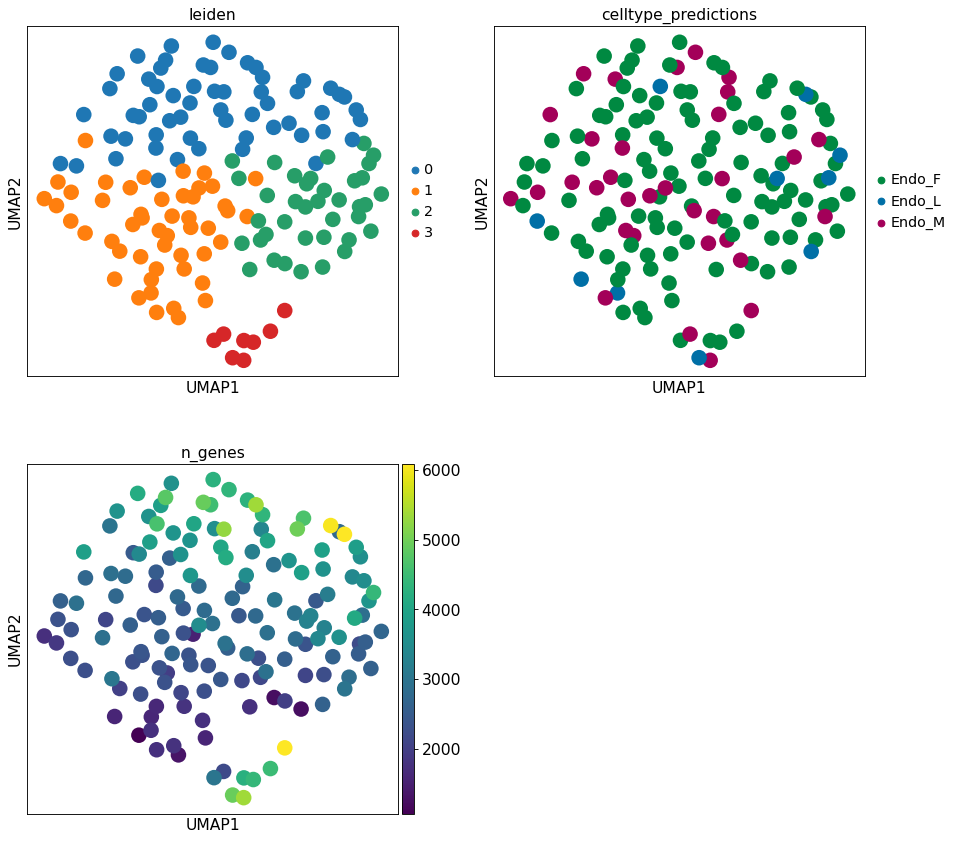

In [12]:
#clustering
sc.pl.umap(temp_cells, color=["leiden",'celltype_predictions', 'n_genes'],ncols=2)

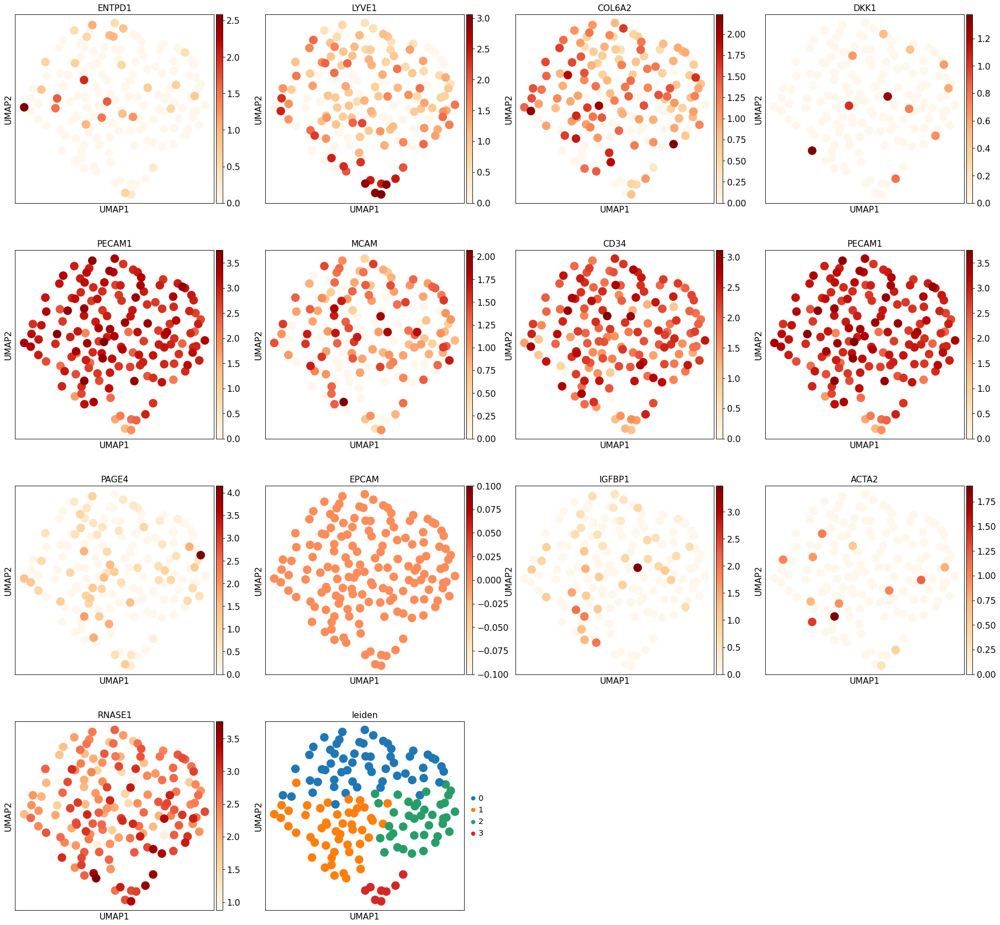

In [13]:
sc.pl.umap(temp_cells, color=[ 'ENTPD1', 'LYVE1', 'COL6A2', 'DKK1','PECAM1','MCAM','CD34','PECAM1',
                         'PAGE4','EPCAM', 'IGFBP1', 'ACTA2','RNASE1',
                         'leiden'],color_map='OrRd')

In [14]:
temp_cells

AnnData object with n_obs × n_vars = 153 × 36601
    obs: 'sample', 'donor', 'termination', 'day', 'pcw', 'percent_mito', 'n_counts', 'n_genes', 'batch', 'HTO3', 'HTO4', 'HTO5', 'total_hto_counts', 'fraction_HTO3', 'fraction_HTO4', 'fraction_HTO5', 'percent_ribo', 'doublet_scores', 'predicted_doublets', 'most_likely_hypothesis', 'cluster_feature', 'negative_hypothesis_probability', 'singlet_hypothesis_probability', 'doublet_hypothesis_probability', 'Classification', 'leiden', 'celltype_predictions', 'probabilities', 'identity'
    var: 'gene_ids', 'feature_types', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'Classification_colors', 'celltype_predictions_colors', 'donor_colors', 'hvg', 'identity_colors', 'leiden', 'leiden_colors', 'neighbors', 'rank_genes_groups', 'umap', 'log1p'
    obsm: 'X_pca', 'X_umap'
    layers: 'raw_counts'
    obsp: 'connectivities', 'distances'

In [15]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden']

#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden"].map(lambda x: 
                            {"0": "Endo_f", "1": "Endo_f", "2": "Endo_f","3": "Endo_f"}
                            .get(x, x)).astype("category"))


In [16]:
adata= identityTransfer(temp_cells, adata)

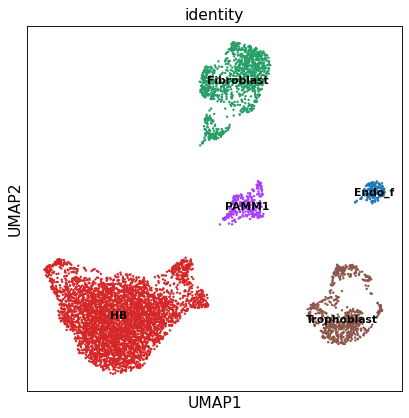

In [17]:
sc.pl.umap(adata, color=['identity'], legend_loc='on data',legend_fontsize='x-small')

### --- Fibroblasts ---  

In [18]:
#Selecting the cells in the desired clusters
temp_cells = adata[adata.obs['identity'] == 'Fibroblast']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [19]:
# Run PCA
#sc.tl.pca(temp_cells)

sc.pp.neighbors(temp_cells, n_neighbors=20)
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden", resolution=0.5)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 6 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


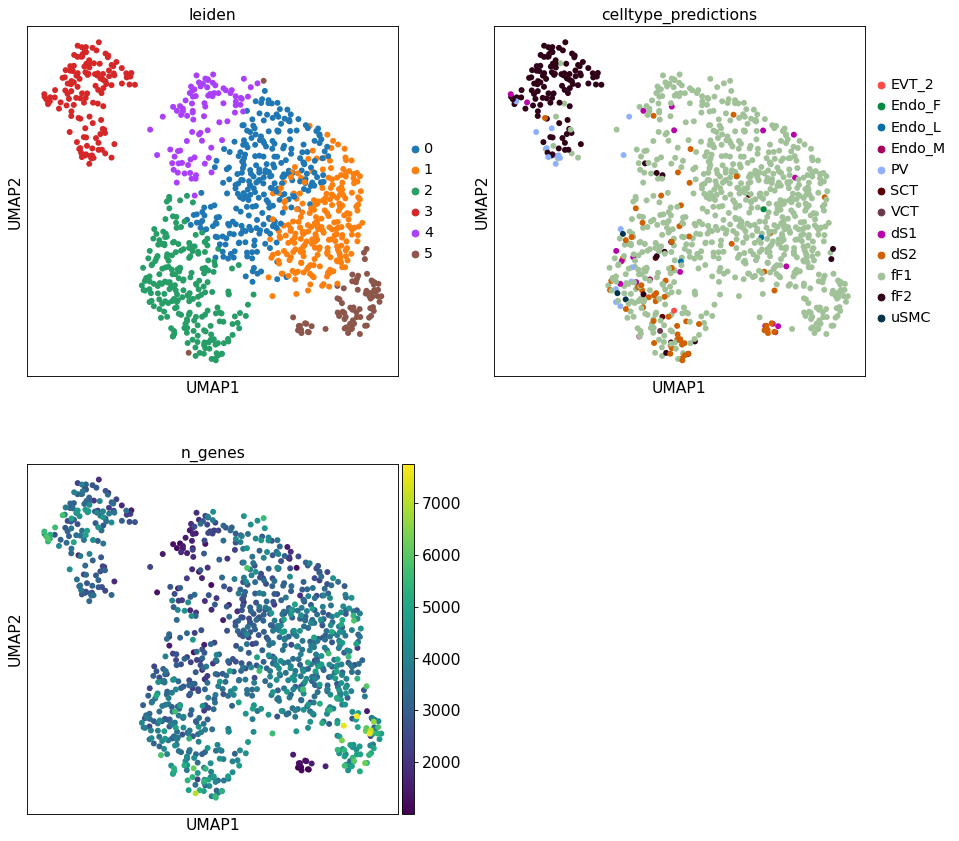

In [20]:
#clustering
sc.pl.umap(temp_cells, color=["leiden",'celltype_predictions', 'n_genes'],ncols=2)

#### Fibroblasts differential markers

F1: DKK1, SERPINE2


F2: PDGFRB, AGTR1

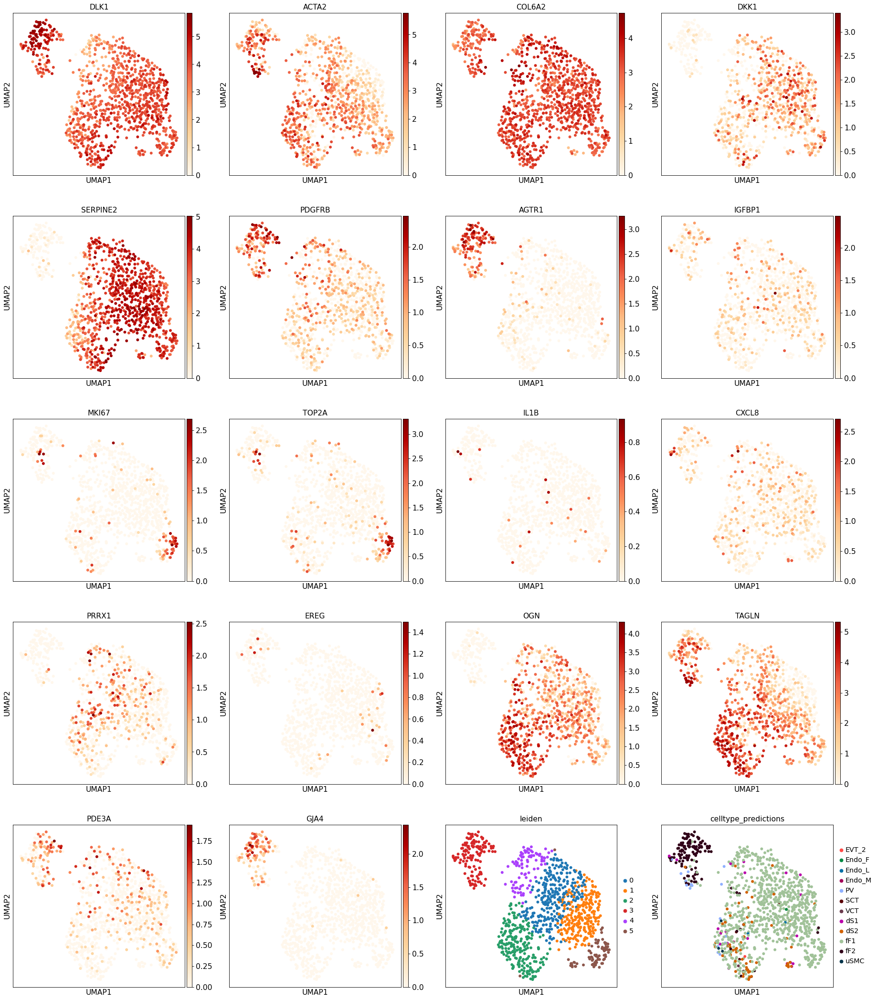

In [21]:
sc.pl.umap(temp_cells, color=['DLK1', 'ACTA2', 'COL6A2',
                              'DKK1','SERPINE2', #F1
                              'PDGFRB','AGTR1', #F2
                              'IGFBP1', #dS
                              'MKI67','TOP2A', #F_p
                              'IL1B', 'CXCL8', 'PRRX1','EREG', #F_inf
                              'OGN', 'TAGLN',  #F_sm
                            'PDE3A', 'GJA4',  #PV
                         'leiden',"celltype_predictions" ],color_map='OrRd')

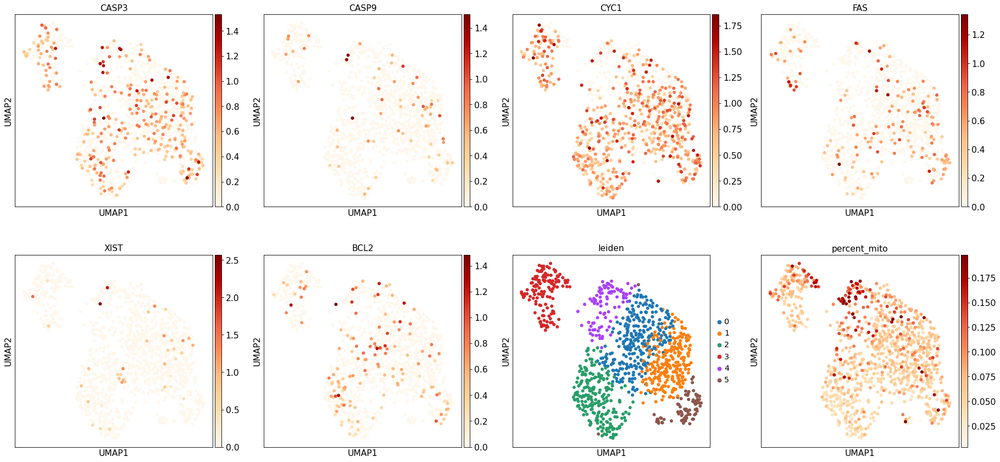

In [22]:
sc.pl.umap(temp_cells, color=['CASP3', 'CASP9', 'CYC1','FAS','XIST','BCL2', 'leiden', 'percent_mito'],
           color_map='OrRd')

In [23]:
#COpying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden"].map(lambda x: 
                            {"0": "F", "1": "F", "2": "F_sm", "3": "PV","4": "F", "5": "F_p" }
                            .get(x, x)).astype("category"))

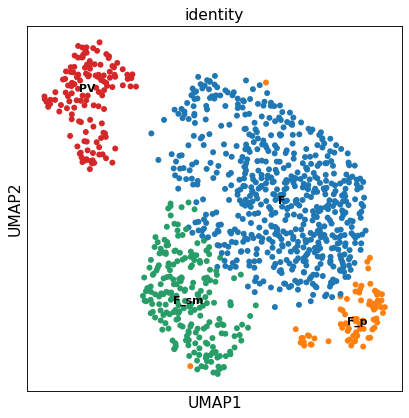

In [24]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [25]:
adata= identityTransfer(temp_cells, adata)

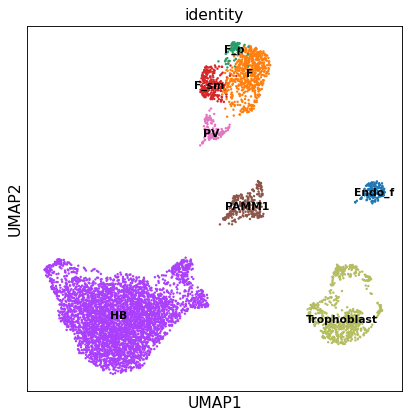

In [26]:
# use scVI imputed values for plotting
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

### -- Trophoblasts --

In [27]:
temp_cells = adata[adata.obs['identity'] == 'Trophoblast']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [28]:
# Run PCA
#sc.tl.pca(temp_cells)

sc.pp.neighbors(temp_cells, n_neighbors=20)
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden", resolution=1)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:01)
running Leiden clustering
    finished: found 9 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


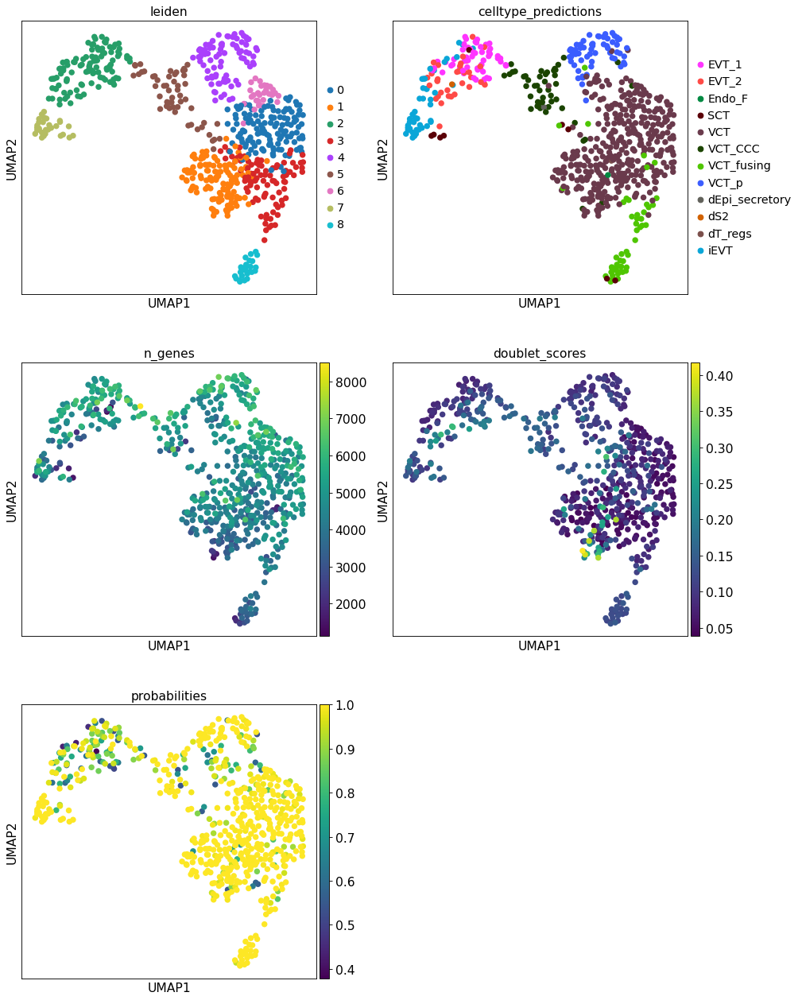

In [29]:
#clustering
sc.pl.umap(temp_cells, color=["leiden",'celltype_predictions', 'n_genes','doublet_scores', 'probabilities'],ncols=2)

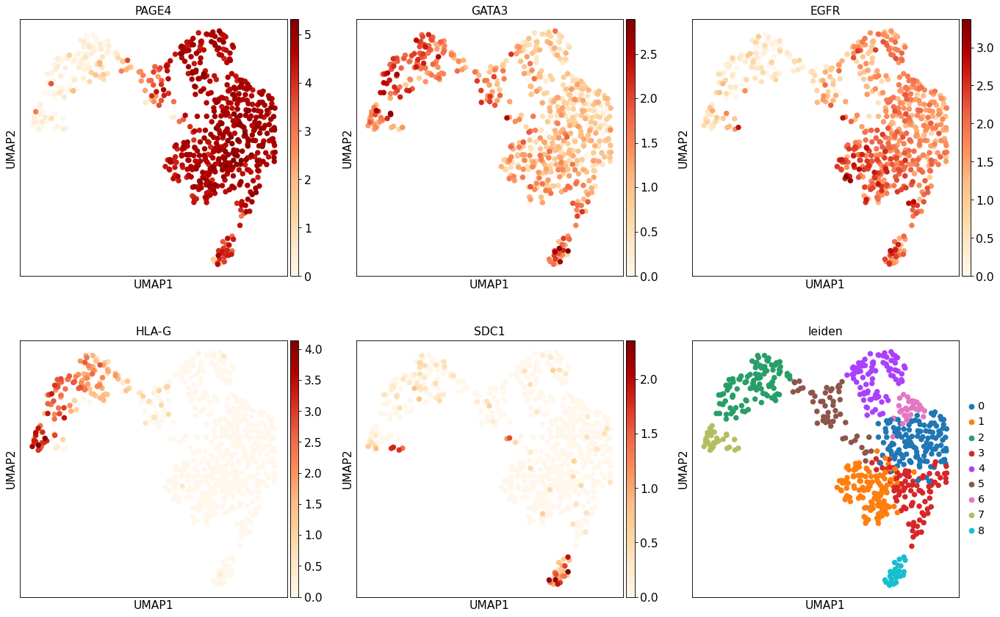

In [30]:
sc.pl.umap(temp_cells, color=['PAGE4', 'GATA3', 'EGFR', 'HLA-G','SDC1','leiden']
           ,color_map='OrRd', ncols=3)

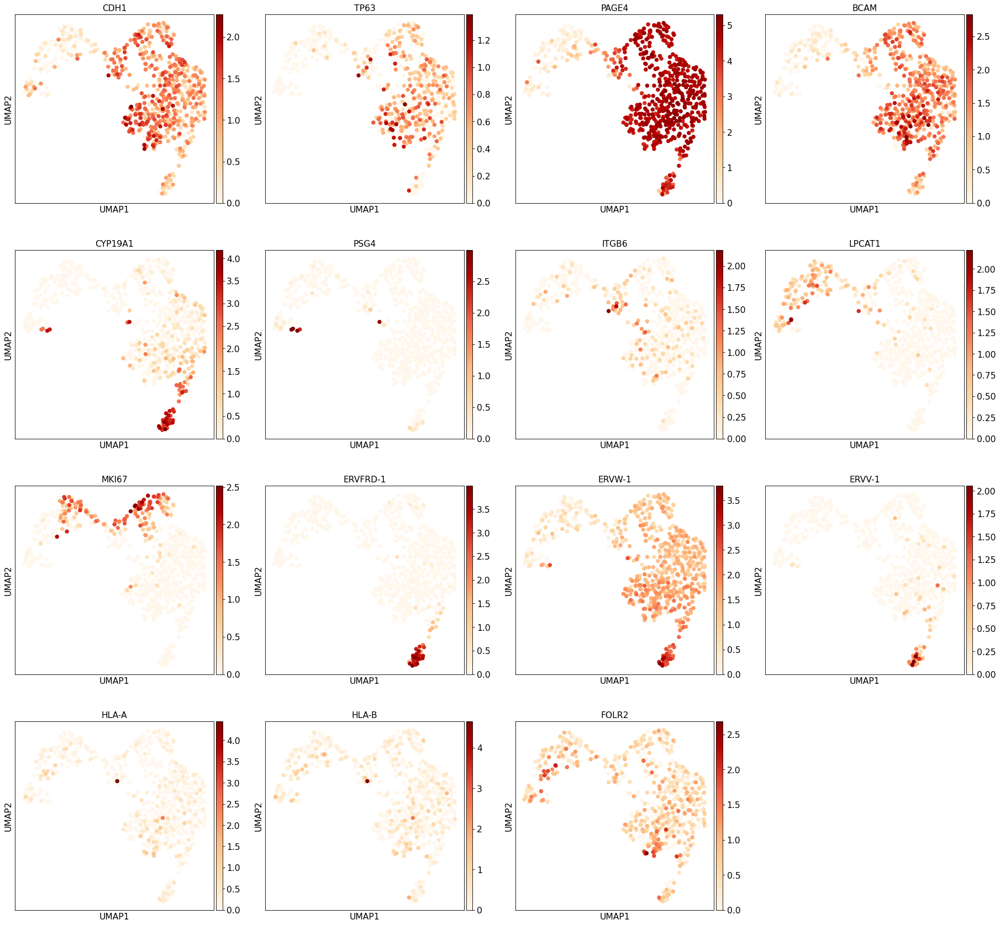

In [31]:
sc.pl.umap(temp_cells, color=['CDH1','TP63','PAGE4','BCAM', #VCT
                         'CYP19A1','PSG4', #SCT
                              'ITGB6','LPCAT1', #VCT-CCC
                         'MKI67', #VCT-p
                         'ERVFRD-1','ERVW-1','ERVV-1', #VCT-fusing
                         'HLA-A','HLA-B', 'FOLR2', # NO trophoblast
                             ], use_raw=False, color_map='OrRd')

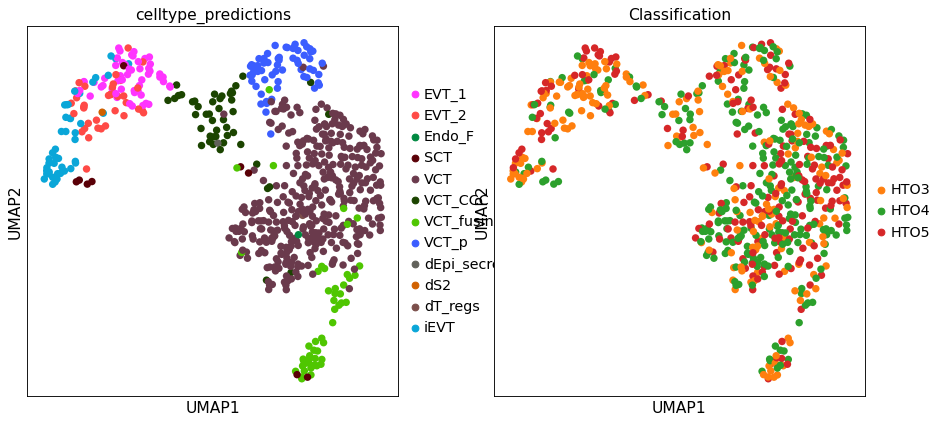

In [32]:
sc.pl.umap(temp_cells, color=["celltype_predictions", 'Classification'],
           ncols=2)

In [33]:
## Copying the value of the leiden cluster. The new column will help to change it's values for # the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden"].map(lambda x: 
                            {"0": "VCT", "1": "VCT", "2": "EVT", "3": "VCT", "4": "VCT_p", "5": "VCT_CCC","6": "VCT", "7": "iEVT",
                             "8": "VCT_fusing" }
                            .get(x, x)).astype("category"))

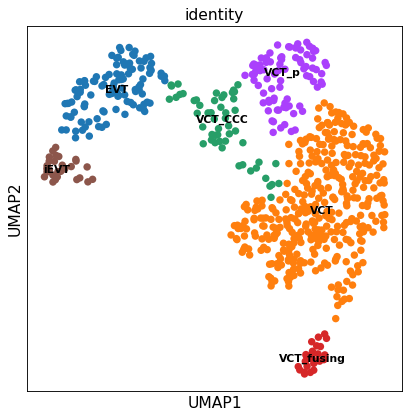

In [34]:
# use scVI imputed values for plottin
sc.pl.umap(temp_cells, color=['identity' ], legend_loc='on data',legend_fontsize='x-small')

In [35]:
adata= identityTransfer(temp_cells, adata)

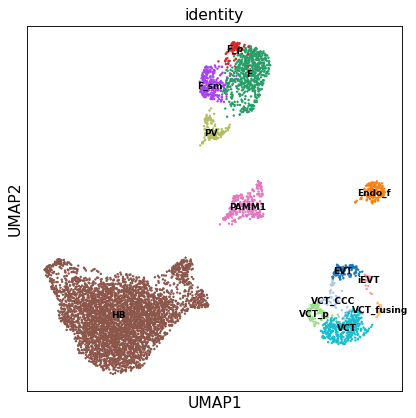

In [36]:
# use scVI imputed values for plottin
sc.pl.umap(adata, color=['identity' ], legend_loc='on data',legend_fontsize='xx-small')

### -- HB --

In [37]:
temp_cells= adata[adata.obs['identity'] == 'HB']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [38]:
# Run PCA
#sc.tl.pca(temp_cells)

sc.pp.neighbors(temp_cells, n_neighbors=20)
sc.tl.umap(temp_cells)

#clustering
sc.tl.leiden(temp_cells, key_added="leiden", resolution=0.4)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden clustering
    finished: found 5 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)


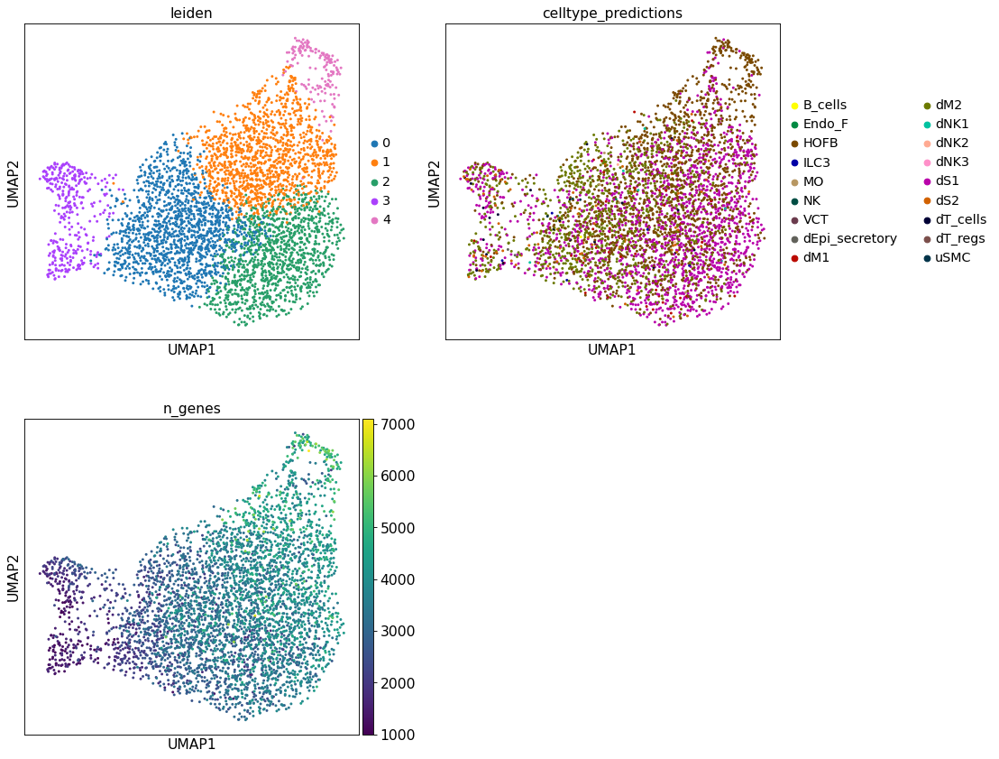

In [39]:
#clustering
sc.pl.umap(temp_cells, color=["leiden",'celltype_predictions', 'n_genes'],ncols=2)

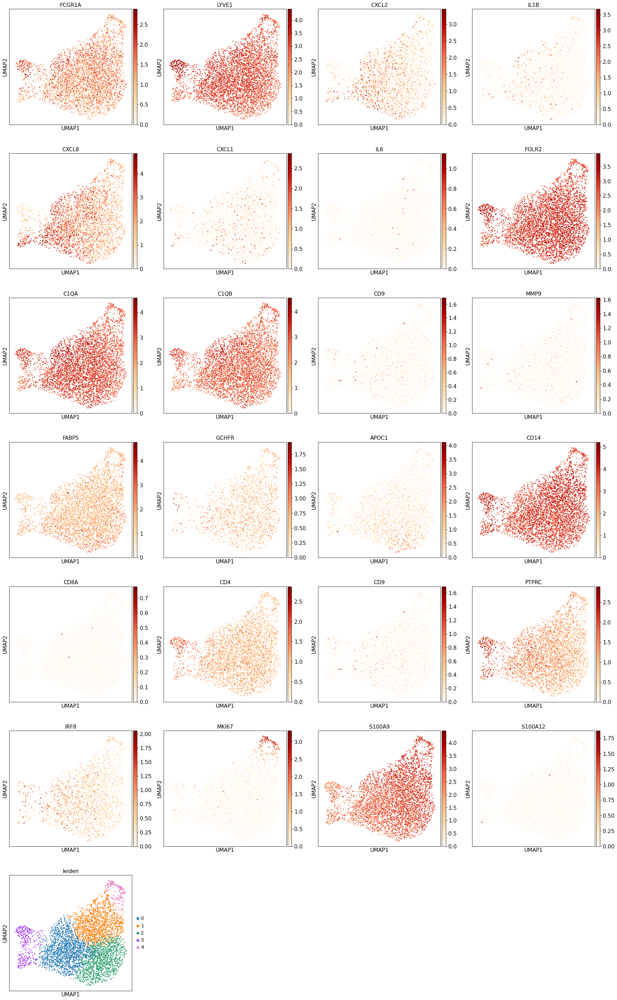

In [40]:
#dM1: CXCL2, IL1B, SOD2
#dM2: C1QB,C1QA, SEPP1, FOLR2, IL1B neg
#dM3: APOC1, CD9, GCHFR
sc.pl.umap(temp_cells, color=['FCGR1A','LYVE1', #HB
                              'CXCL2', 'IL1B', 'CXCL8', 'CXCL1', 'IL6', #HB_inf
                              'FOLR2', #HB & dM2
                              'C1QA','C1QB',#dM2
                              'CD9', 'MMP9','FABP5','GCHFR','APOC1',#M3
                              'CD14',
                              'CD8A','CD4','CD9','PTPRC',
                              'IRF8', #DC1
                              'MKI67',#HB_p
                              'S100A9','S100A12',#Mo
                              'leiden'],color_map='OrRd')

In [41]:
#ranking genes check top genes
sc.tl.rank_genes_groups(temp_cells, groupby='leiden', method='logreg')

ranking genes
/opt/conda/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
 (0:00:45)


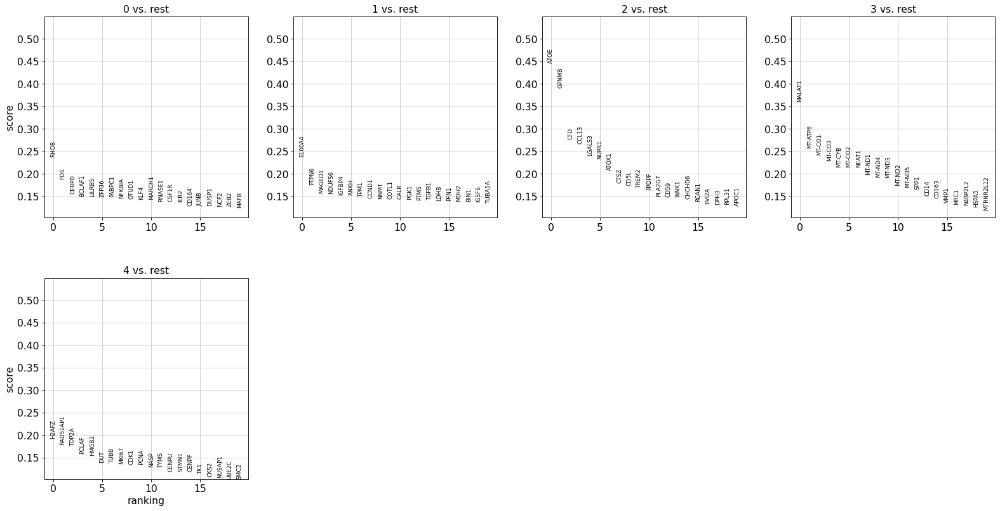

In [42]:
sc.pl.rank_genes_groups(temp_cells)

In [43]:
#Copying the value of the leiden cluster. The new column will help to change it's values for
# the cluster identity
temp_cells.obs['identity']= temp_cells.obs['leiden']


#Function that changes the cluster names as indicated
temp_cells.obs['identity'] = (temp_cells.obs["leiden"].map(lambda x: 
                            {"0": "HB", "1": "HB", "2": "HB", "3": "lowQC", "4": "HB_p"}
                            .get(x, x)).astype("category"))

In [44]:
adata= identityTransfer(temp_cells, adata)

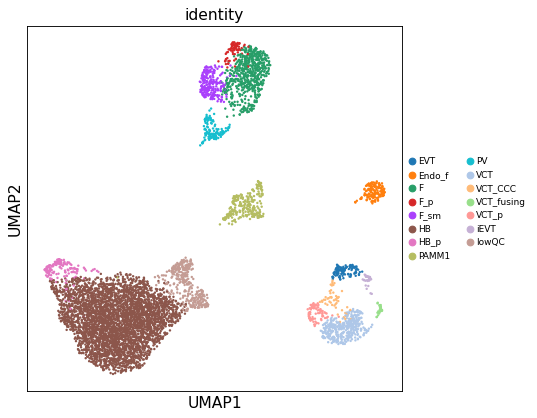

In [45]:
sc.pl.umap(adata, color=['identity' ],legend_fontsize='xx-small' )

In [46]:
## Remove lowQC
adata = adata[adata.obs['identity'] != 'lowQC']

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [ ]:
# Re-Run PCA
sc.pp.neighbors(adata, n_neighbors=10)
sc.tl.umap(adata)

#clustering
sc.tl.leiden(adata, key_added="leiden", resolution=0.4)

computing neighbors
    using 'X_pca' with n_pcs = 50


In [ ]:
#clustering
sc.pl.umap(adata, color=["leiden",'celltype_predictions', 'n_genes', 'identity','probabilities'],ncols=2)

In [ ]:
#Dictionary with marker genes per cell type. You can substitute this for a list of genes only.
marker_genes = {
    'Troph':{'GATA2','GATA3','EGFR'},
    #'SCT':{'MFSD2A','SDC1','CYP19A1'}
    'VCT-fusing': {'ERVFRD-1','ERVW-1','ERVV-1'},
    'VCT': {'CDH1','TP63','PAGE4','BCAM'},
    'VCT-P': {'MKI67'},
    'VCT-CCC': {'ITGB6','LPCAT1'},
    
    'EVT': {'CSH1',"HLA-G"},   
    'EVT-1': {'ACAN'},
    'EVT-2': {'SERPINE2','ERBB2'},
    'iEVT': {'PAPPA','PLAC8'},
   
    'F':{'DKK1','SERPINE2'},
    'F_p':{'MKI67','TOP2A'}, 
    #'F_inf': {'IL1B', 'CXCL8', 'PRRX1','EREG'},
    'F_sm': {'OGN', 'TAGLN'},
    'PV': { 'PDE3A', 'GJA4'},
    'Endo f':{'PECAM1','CD34',}, #'LYVE1'
  
    'HB': {'FCGR1A', 'FOLR2', 'LYVE1','CD14'},
    'HB_p': {'MKI67'},
    'PAMM1':{ 'MMP9','MGST1','CD9',"CHI3L1" },#"CHI3L1" 

}

In [ ]:
adata.obs['identity'].cat.categories

In [ ]:
#adata.obs['identity'].cat.reorder_categories(['VCT','VCT_p','VCT_CCC','EVT',
                                               #'F1', 'F2','Endo_f',  'HB', 'M3' ], inplace = True)
sc.pl.dotplot(adata, marker_genes, groupby='identity', use_raw=False, standard_scale = 'var')

In [ ]:
def Barplot(which_var, adata, var='leiden', height=3, color = False, suffix= ''):
    
    '''
    Function to plot barplots plotting the proportion of cells per catergory in var, coming from each category in which_var.
    
    Parameters:
        which_var: column name in .obs. Contains the categories to contrast.
        adata: anndata object.
        var: column name in .obs. It contains the categories of the cells.
        height: plot height
        color: colors to use
        suffix: string. Suffix to be added at the end of the name of the plot.
    
    Return:
        Saves bar plot as a pdf.
        
    '''
    
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, 
                                 color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
    ax1.figure.savefig(str(sc.settings.figdir)+'/hrv132_barplot_'+var+'_proportions_'+which_var+ suffix+'.pdf',
                       bbox_inches='tight',
                       dpi=300, format= 'pdf', optimize=True)

In [ ]:
Barplot('identity', adata, var='Classification')

In [ ]:
temp_cells = adata[adata.obs['identity'] != 'HB']

In [ ]:
Barplot('identity', temp_cells, var='Classification')

In [ ]:
#getting back raw counts
adata.X=adata.layers["raw_counts"].copy()

In [ ]:
adata.write('rna4_annotate_donorHrv132_CleanV1.h5ad')

In [ ]:
adata.X.shape